## Import Necessary Library

In [20]:
# System library imports
import os
from zipfile import ZipFile
import warnings
from itertools import chain
import time
import zipfile
from io import BytesIO
from PIL import Image

# General library imports
import cv2
import folium
import geopandas as gpd
import ipywidgets as widgets
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from tqdm import tqdm

# Raster-related imports
import glob
import rasterio
import rasterio.features
import rasterio.warp
from rasterio.plot import show
import richdem as rd

# GIS-related imports
from sentinelsat import SentinelAPI, read_geojson, geojson_to_wkt
from shapely.geometry import Point, Polygon, MultiPolygon
from shapely.ops import transform
import pyproj
from sentinelsat import SentinelAPI, read_geojson, geojson_to_wkt
from shapely.geometry import MultiPolygon, Polygon
import folium 


# Weather-related imports
from pyowm import OWM

# Numeric and mathematical imports
from numpy import gradient, pi, arctan, arctan2, sin, cos, sqrt

# OS-related imports
import os.path

# Data visualization imports
import ipywidgets as widgets
import matplotlib.pyplot as plt
import pygraphviz as pgv
from IPython.display import Image
import plotly.express as px
import plotly.subplots as sp
import plotly.graph_objs as go
from bokeh.plotting import figure, show
from bokeh.models import ColumnDataSource
from bokeh.layouts import gridplot
import streamlit as st
import pandas as pd
import altair as alt
import dash
import dash_core_components as dcc
from dash import html
from dash.dependencies import Input, Output

%matplotlib inline

# Other imports
from pyproj import CRS

# Data profiling libraries
from ydata_profiling import compare, ProfileReport
from ydata_profiling.visualisation.plot import timeseries_heatmap, plot_word_cloud

## Necessary functions

In [21]:
def open_geotiff_from_zip(zip_file_path, name_contains):
    with zipfile.ZipFile(zip_file_path, 'r') as zip_file:
        matching_files = [file for file in zip_file.namelist() if name_contains in file]

        if not matching_files:
            raise ValueError(f"No files in the zip archive match the pattern: {name_contains}")

        selected_file_name = matching_files[0]

        with zip_file.open(selected_file_name) as file:
            # Check if the file is compressed and handle accordingly
            if selected_file_name.lower().endswith('.gz'):
                with gzip.GzipFile(fileobj=file) as gzipped_file:
                    geotiff_content = BytesIO(gzipped_file.read())
            else:
                geotiff_content = BytesIO(file.read())

    dataset = rasterio.open(geotiff_content)
    
    # Access information about the GeoTIFF
    # print("CRS:", dataset.crs)
    # print("Bounds:", dataset.bounds)
    return dataset

In [22]:
def calculate_water_indices(image_path):
    # Sentinel-2 L2A bands
    red_band = open_geotiff_from_zip(image_path, 'B04')  # Red, 664.6 nm (S2A), 665.0 nm (S2B)    
    green_band = open_geotiff_from_zip(image_path, 'B03')  # Green, 559.8 nm (S2A), 559.0 nm (S2B)    
    blue_band = open_geotiff_from_zip(image_path, 'B02')  # Blue, 492.4 nm (S2A), 492.1 nm (S2B)    
    nir_band = open_geotiff_from_zip(image_path, 'B08')  # NIR, 832.8 nm (S2A), 833.0 nm (S2B)    
    swir_band = open_geotiff_from_zip(image_path, 'B11')  # SWIR, 1613.7 nm (S2A), 1610.4 nm (S2B)
    swir_band_ = open_geotiff_from_zip(image_path, 'B12')  # SWIR, 2202.4 nm (S2A), 2185.7 nm (S2B)    
    water_vapour = open_geotiff_from_zip(image_path, 'B09')  # Water vapour, 945.1 nm (S2A), 943.2 nm (S2B)
    true_color = open_geotiff_from_zip(image_path, 'True_color')  # RGB Sat Image

    # Read band data as arrays
    red_data = red_band.read(1)
    green_data = green_band.read(1)
    blue_data = blue_band.read(1)
    nir_data = nir_band.read(1)
    swir_data = swir_band.read(1)

    # Detect RGB channels
    band_descriptions = true_color.descriptions
    print('band_descriptions: ', band_descriptions)

    # Calculate Normalized Difference Water Index (NDWI) for water extent
    """
    NDWI (Normalized Difference Water Index):
        Measures water content.
        Normal: 0 to 0.2 (clear water).
        Dangerous: > 0.4 (increased turbidity).
    """
    ndwi = (green_data - nir_data) / (green_data + nir_data)

    # Calculate Normalized Difference Snow Index (NDSI) for snow detection
    """
    NDSI (Normalized Difference Snow Index):
        Identifies snow cover.
        Normal: 0 to 0.2 (minimal snow).
        Dangerous: > 0.4 (extensive snow).
    """
    ndsi = (green_data - swir_data) / (green_data + swir_data)

    # Calculate Turbidity Index (e.g., Red-NIR or other suitable indices)
    """
    Turbidity Index:
        Gauges water clarity.
        Normal: 0 to 5 NTU (clear water).
        Dangerous: > 5 NTU (cloudy water).
    """
    turbidity_index = red_data / nir_data  # Placeholder, adjust as needed

    # Calculate Chlorophyll-a concentration using a suitable algorithm
    """
    Chlorophyll Concentration:
        Estimates chlorophyll levels.
        Normal: 0 to 10 µg/L (healthy ecosystems).
        Dangerous: > 20 µg/L (excessive algal growth).
    """
    chlorophyll_concentration = 10 * (nir_data - red_data) / (nir_data + red_data)  # Placeholder, adjust as needed

    # Calculate Evapotranspiration Index (e.g., NDVI or other suitable indices)
    """
    Evapotranspiration Index:
        Reflects water loss from soil and plants.
        Normal: Varied based on vegetation health / 0 to 0.2 (Low vegetation cover, limited water loss)
        Moderate: 0.2 to 0.5 (Moderate vegetation cover, moderate water loss)
        Dangerous: 0.5 to 1 (High vegetation cover, significant water loss)
    """
    evapotranspiration_index = (nir_data - red_data) / (nir_data + red_data)  # Placeholder, adjust as needed

    # Create a DataFrame with median values
    median_values = {
        'NDWI': np.nanmedian(ndwi),
        'NDSI': np.nanmedian(ndsi),
        'Turbidity_Index': np.nanmedian(turbidity_index),
        'Chlorophyll_Concentration': np.nanmedian(chlorophyll_concentration),
        'Evapotranspiration_Index': np.nanmedian(evapotranspiration_index)
    }
    df_median_values = pd.DataFrame(median_values, index=[0])

    return ndwi, ndsi, turbidity_index, chlorophyll_concentration, evapotranspiration_index, df_median_values

In [23]:
def plot_indices(ndwi, turbidity_index, chlorophyll_concentration, evapotranspiration_index, title, fname):
    plt.figure(figsize=(14, 10))
    
    plt.subplot(3, 2, 1)
    plt.imshow(ndwi, cmap='Blues')
    plt.colorbar(label='NDWI')
    plt.title('Normalized Difference Water Index (Water Extent)')

    plt.subplot(3, 2, 2)
    plt.imshow(ndwi, cmap='plasma')
    plt.colorbar(label='NDSI')
    plt.title('Normalized Difference Snow Index (snow detection)')

    plt.subplot(3, 2, 3)
    plt.imshow(turbidity_index, cmap='viridis')
    plt.colorbar(label='Turbidity Index')
    plt.title('Turbidity Index')
 
    plt.subplot(3, 2, 4)
    plt.imshow(chlorophyll_concentration, cmap='viridis')
    plt.colorbar(label='Chlorophyll Concentration')
    plt.title('Chlorophyll Concentration')

    plt.subplot(3, 2, 5)
    plt.imshow(evapotranspiration_index, cmap='RdYlGn')
    plt.colorbar(label='Evapotranspiration Index')
    plt.title('Evapotranspiration Index')

    # Add a big title to the entire set of subplots
    plt.suptitle('Water Analysis and Quality Indices: ' + title, fontsize=14, y=0.97)

    # plt.tight_layout()
    

    # Save the figure as an image
    plt.savefig(f'deliverables/Analysis_Plot/Water Analysis and Quality Indices_{fname}.png')

    plt.show()

In [24]:
def detect_water(image_path):
    # Sentinel-2 L2A bands
    green_band = open_geotiff_from_zip(image_path, 'B03')  # Green, 559.8 nm (S2A), 559.0 nm (S2B)	
    nir_band = open_geotiff_from_zip(image_path, 'B08')  # NIR, 832.8 nm (S2A), 833.0 nm (S2B)	
    
    # Extract bands for green and NIR (Near Infrared)
    green_data = green_band.read(1)
    nir_data = nir_band.read(1)

    # Calculate Normalized Difference Water Index (NDWI)
    ndwi = (green_data - nir_data) / (green_data + nir_data)

    # Thresholding to identify water pixels
    water_mask = ndwi >= 0.0  # Adjust the threshold as needed
    print()
    return water_mask

In [25]:
def plot_water_detection(image_path, water_mask):
    true_color = open_geotiff_from_zip(image_path, 'True_color')  # RGB Sat Image
    
    plt.figure(figsize=(10, 10))

    # Read the RGB bands for visualization
    rgb_image = true_color.read([3, 2, 1])
    
    # print(rgb_image)

    # Apply the water mask
    # rgb_image[:, water_mask] = [0, 0, 255]  # Set water pixels to blue
    
    # # Apply the water mask/Ensure water_mask has the same shape as the individual bands
    water_mask = water_mask.reshape(rgb_image.shape[1:])

    plt.imshow(np.moveaxis(rgb_image, 0, -1) / 255.0, cmap='viridis')  # Normalize to [0, 1]
    plt.title('Water Detection')
    plt.show()

In [26]:
def calculate_water_coverage(image_path, water_mask):
    
    true_color = open_geotiff_from_zip(image_path, 'True_color')  # RGB Sat Image
    
    # Get pixel resolution in meters
    transform = true_color.transform
    pixel_width = transform[0]
    pixel_height = transform[4]

    # Calculate the area of each pixel in square meters
    pixel_area = abs(pixel_width * pixel_height)

    # Count the number of water pixels
    water_pixels = np.sum(water_mask)

    # Calculate the total coverage area in square meters
    coverage_area = water_pixels * pixel_area

    return coverage_area

## Ganges_river

India_Ganges River Water Quality Analysis May-2021

band_descriptions:  (None, None, None)


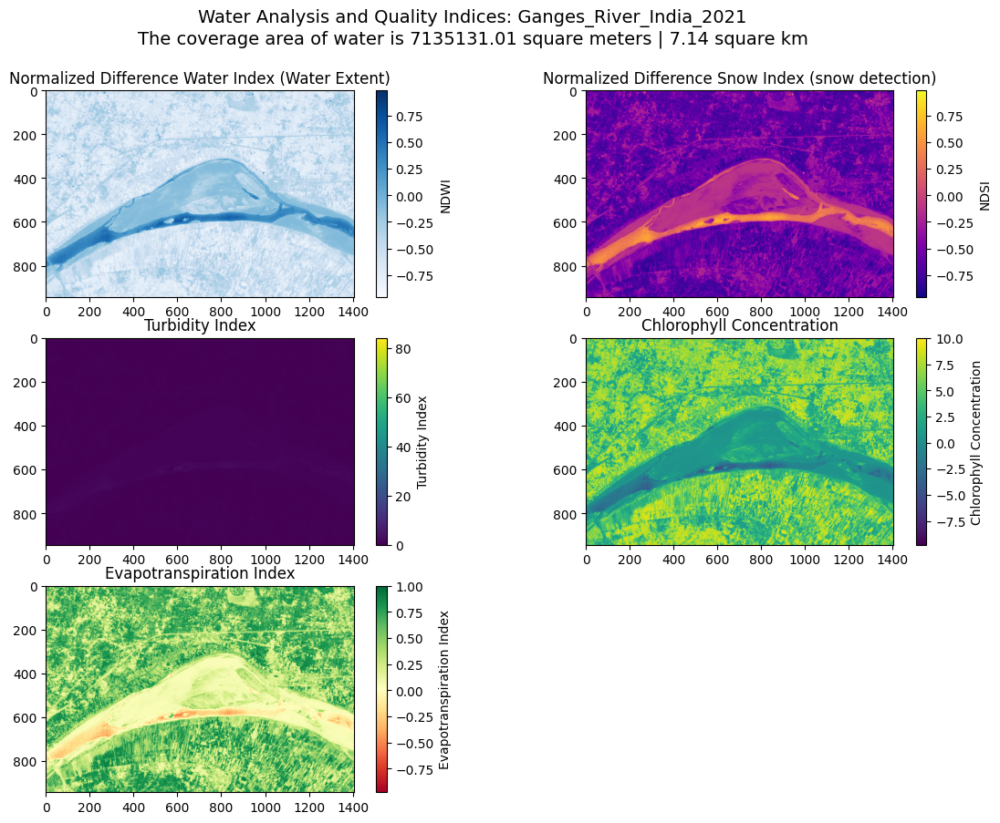

India_Ganges River Water Quality Analysis May-2022

band_descriptions:  (None, None, None)


/tmp/ipykernel_8393/1387134106.py:48: RuntimeWarning: divide by zero encountered in divide
  turbidity_index = red_data / nir_data  # Placeholder, adjust as needed


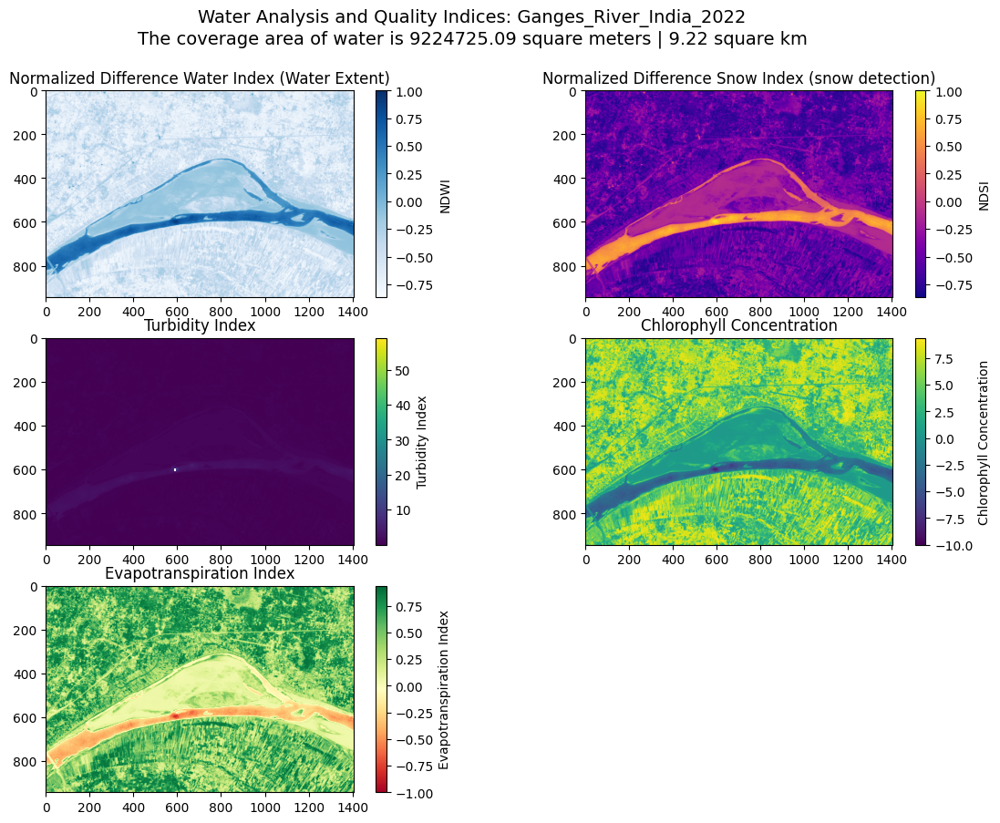

India_Ganges River Water Quality Analysis May-2022

band_descriptions:  (None, None, None)


/tmp/ipykernel_8393/1387134106.py:48: RuntimeWarning: divide by zero encountered in divide
  turbidity_index = red_data / nir_data  # Placeholder, adjust as needed


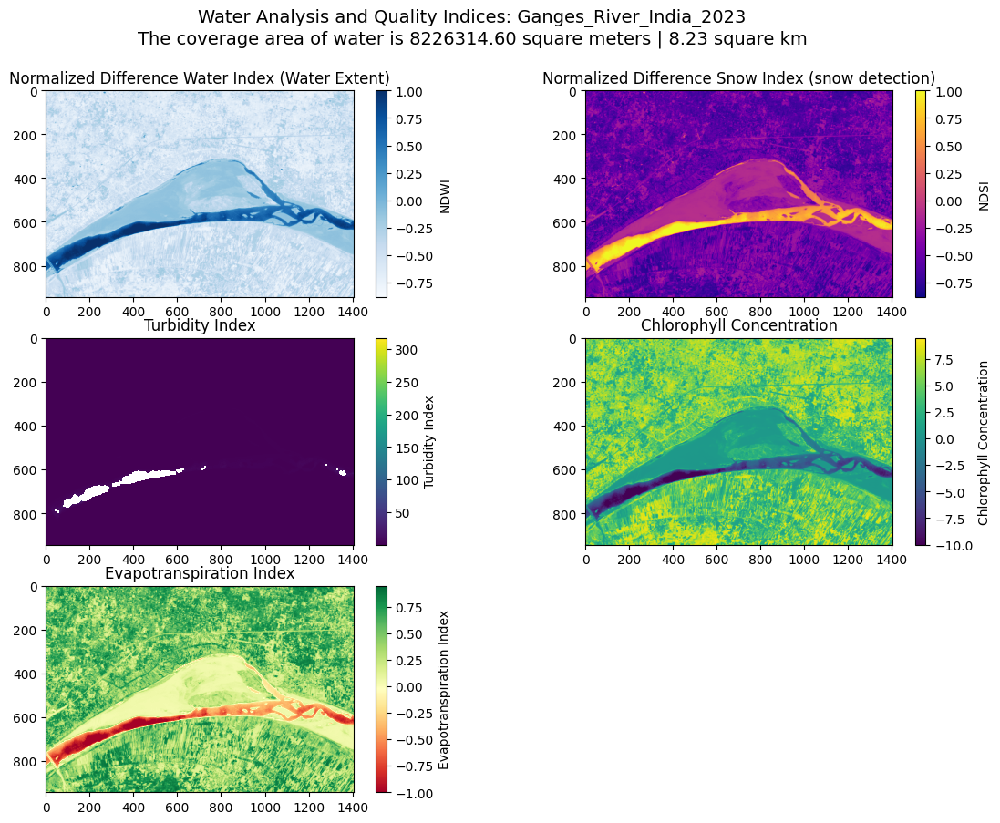

In [27]:
ganges_river_image_2021 = '../Datasets/Raster/Ganges_River_India//2021-03-11-00:00_2021-03-11-23:59_Sentinel-2_L2A.zip'
ganges_river_image_2022 = '../Datasets/Raster/Ganges_River_India/2022-03-11-00:00_2022-03-11-23:59_Sentinel-2_L2A.zip'
ganges_river_image_2023 = '../Datasets/Raster/Ganges_River_India/2023-03-11-00:00_2023-03-11-23:59_Sentinel-2_L2A.zip'

shape_fname = glob.glob('../Datasets/shapefiles/Ganges_River/ganges_poly.shp')
shapes = []
areastyle = []
poly = []

for file in shape_fname:
    shapes.append(gpd.read_file(file))
    areastyle.append({'fillColor': '#0BEE00','color': '#0BEE00'})
    
poly = Polygon(shapes[0].geometry[0])
polycenter = poly.centroid

m = folium.Map([polycenter.y, polycenter.x], zoom_start=10)

for shape in shapes:
    folium.GeoJson(shape, style_function = lambda x: areastyle[0]).add_to(m)

m.fit_bounds(m.get_bounds()) 
display(m)


print('India_Ganges River Water Quality Analysis May-2021')
water_mask = detect_water(ganges_river_image_2021)
# plot_water_detection(ganges_river_image_2021, water_mask)
coverage_area = calculate_water_coverage(ganges_river_image_2021, water_mask)
water_coverage = f'The coverage area of water is {coverage_area:.2f} square meters | {coverage_area / 1e6:.2f} square km'
# print(f'The coverage area of water is {coverage_area:.2f} square meters | {coverage_area / 1e6:.2f} square km')

ndwi, ndsi, turbidity_index, chlorophyll_concentration, evapotranspiration_index, ganges_river_2021_median_values_df = calculate_water_indices(ganges_river_image_2021)
ganges_river_2021_median_values_df['Year'] = ganges_river_image_2021.split('/')[-1][:4]
ganges_river_2021_median_values_df['Water_Coverage-km'] = f"{coverage_area / 1e6:.2f}"
ganges_river_2021_median_values_df['Location'] = 'Ganges_River_India'

plot_title = ganges_river_image_2021.split('/')[3] + '_' + ganges_river_image_2021.split('/')[-1][:4]
plot_indices(ndwi, turbidity_index, chlorophyll_concentration, evapotranspiration_index, plot_title + f"\n{water_coverage}", plot_title)


print('India_Ganges River Water Quality Analysis May-2022')
water_mask = detect_water(ganges_river_image_2022)
# plot_water_detection(ganges_river_image_2021, water_mask)
coverage_area = calculate_water_coverage(ganges_river_image_2022, water_mask)
water_coverage = f'The coverage area of water is {coverage_area:.2f} square meters | {coverage_area / 1e6:.2f} square km'
# print(f'The coverage area of water is {coverage_area:.2f} square meters | {coverage_area / 1e6:.2f} square km')

ndwi, ndsi, turbidity_index, chlorophyll_concentration, evapotranspiration_index, ganges_river_2022_median_values_df = calculate_water_indices(ganges_river_image_2022)
ganges_river_2022_median_values_df['Year'] = ganges_river_image_2022.split('/')[-1][:4]
ganges_river_2022_median_values_df['Water_Coverage-km'] = f"{coverage_area / 1e6:.2f}"
ganges_river_2022_median_values_df['Location'] = 'Ganges_River_India'

plot_title = ganges_river_image_2022.split('/')[3] + '_' + ganges_river_image_2022.split('/')[-1][:4]
plot_indices(ndwi, turbidity_index, chlorophyll_concentration, evapotranspiration_index, plot_title + f"\n{water_coverage}", plot_title)


print('India_Ganges River Water Quality Analysis May-2022')
water_mask = detect_water(ganges_river_image_2023)
# plot_water_detection(ganges_river_image_2021, water_mask)
coverage_area = calculate_water_coverage(ganges_river_image_2023, water_mask)
water_coverage = f'The coverage area of water is {coverage_area:.2f} square meters | {coverage_area / 1e6:.2f} square km'
# print(f'The coverage area of water is {coverage_area:.2f} square meters | {coverage_area / 1e6:.2f} square km')

ndwi, ndsi, turbidity_index, chlorophyll_concentration, evapotranspiration_index, ganges_river_2023_median_values_df = calculate_water_indices(ganges_river_image_2023)
ganges_river_2023_median_values_df['Year'] = ganges_river_image_2023.split('/')[-1][:4]
ganges_river_2023_median_values_df['Water_Coverage-km'] = f"{coverage_area / 1e6:.2f}"
ganges_river_2023_median_values_df['Location'] = 'Ganges_River_India'

plot_title = ganges_river_image_2023.split('/')[3] + '_' + ganges_river_image_2023.split('/')[-1][:4]
plot_indices(ndwi, turbidity_index, chlorophyll_concentration, evapotranspiration_index, plot_title + f"\n{water_coverage}", plot_title)

### ganges_river data_frames

In [9]:
# Concatenate the DataFrames

ganges_river = pd.concat([ganges_river_2021_median_values_df, ganges_river_2022_median_values_df, ganges_river_2023_median_values_df], ignore_index=True)
ganges_river

,NDWI,NDSI,Turbidity_Index,Chlorophyll_Concentration,Evapotranspiration_Index,Year,Water_Coverage-km,Location
0,-0.512443,-0.476347,0.373053,4.566077,0.456608,2021,7.14,Ganges_River_India
1,-0.493480,-0.445479,0.364694,4.655296,0.465530,2022,9.22,Ganges_River_India
2,-0.467890,-0.444888,0.403260,4.252522,0.425252,2023,8.23,Ganges_River_India


## Nile_river

Egypt_Nile River Water Quality Analysis May-2021

band_descriptions:  (None, None, None)


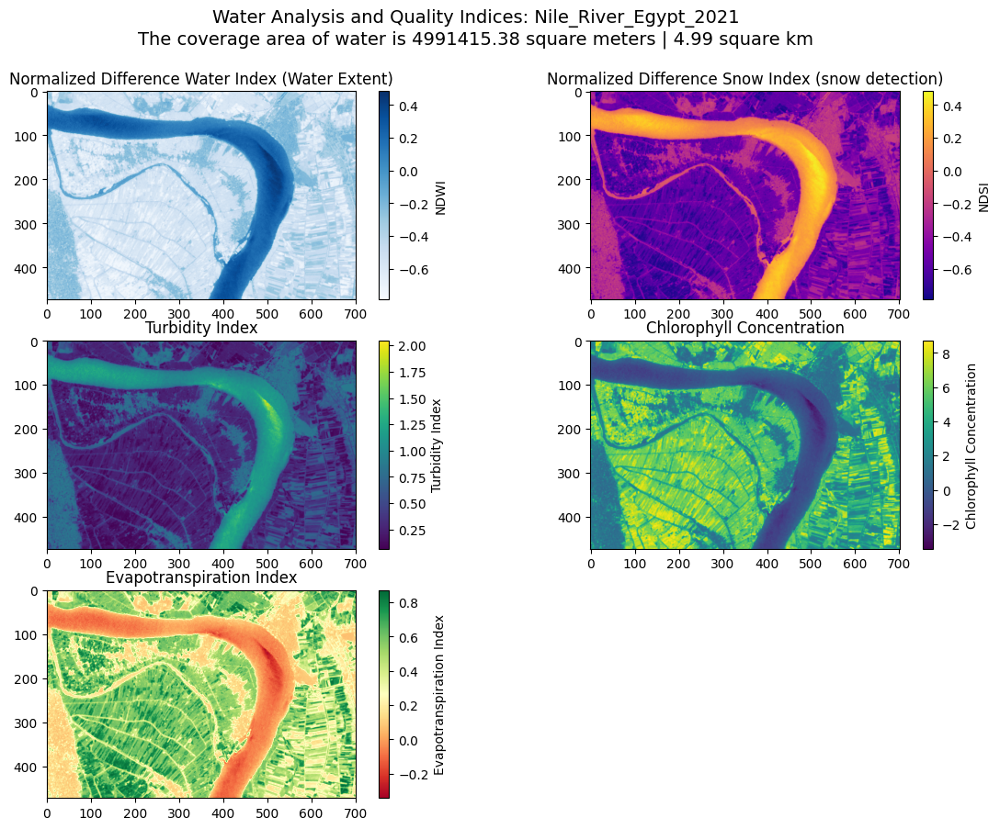

Egypt_Nile River Water Quality Analysis May-2022

band_descriptions:  (None, None, None)


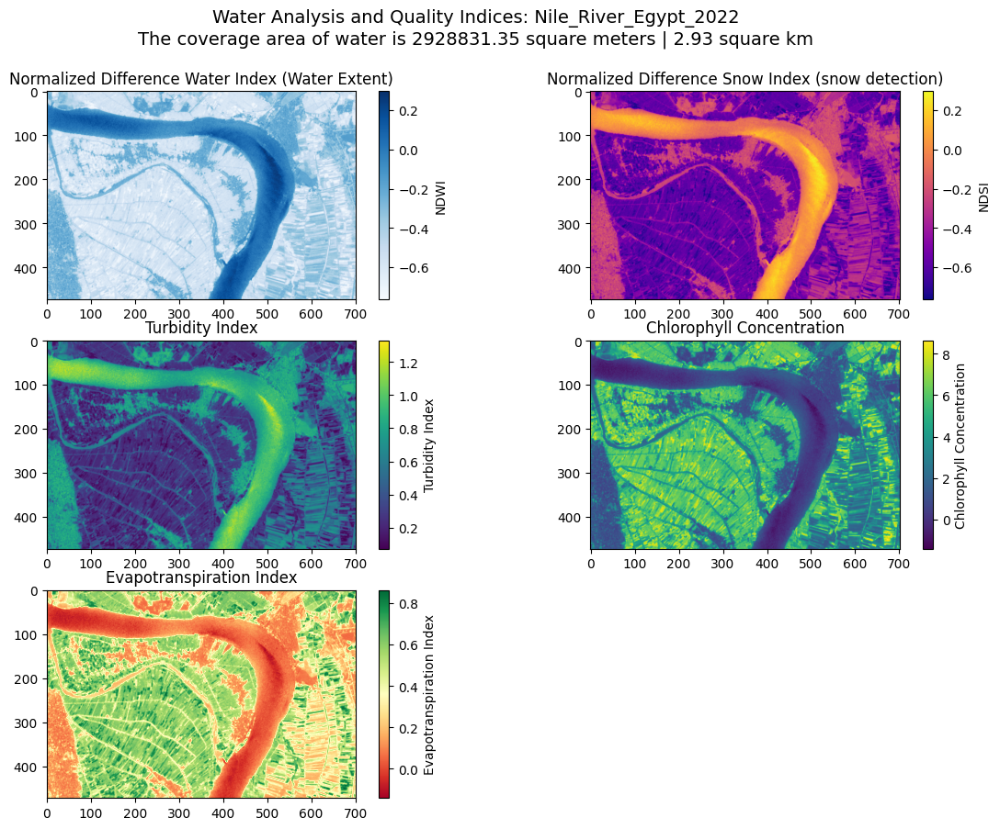

Egypt_Nile River Water Quality Analysis May-2023

band_descriptions:  (None, None, None)


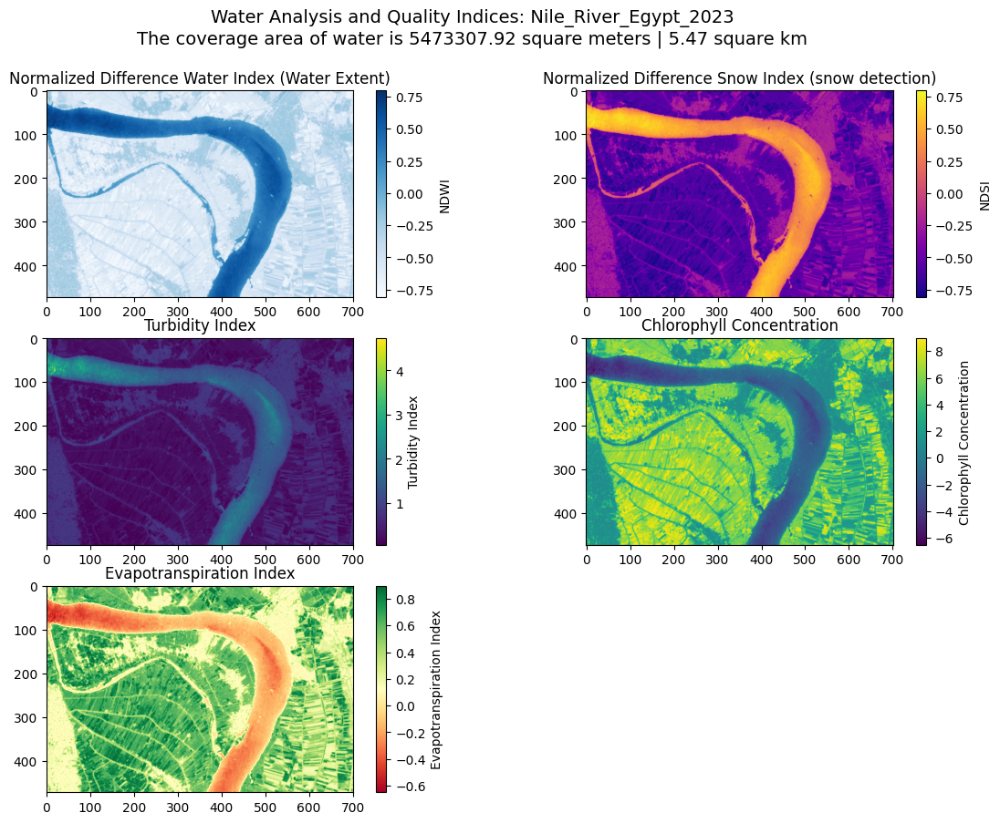

In [34]:
nile_river_image_2021 = '../Datasets/Raster/Nile_River_Egypt//2021-03-11-00:00_2021-03-11-23:59_Sentinel-2_L2A.zip'
nile_river_image_2022 = '../Datasets/Raster/Nile_River_Egypt/2022-04-10-00:00_2022-04-10-23:59_Sentinel-2_L2A.zip'
nile_river_image_2023 = '../Datasets/Raster/Nile_River_Egypt/2023-03-16-00:00_2023-03-16-23:59_Sentinel-2_L2A.zip'

shape_fname = glob.glob('../Datasets/shapefiles/Nile_River/nile_poly.shp')
shapes = []
areastyle = []
poly = []

for file in shape_fname:
    shapes.append(gpd.read_file(file))
    areastyle.append({'fillColor': '#0BEE00','color': '#0BEE00'})
    
poly = Polygon(shapes[0].geometry[0])
polycenter = poly.centroid

m = folium.Map([polycenter.y, polycenter.x], zoom_start=10)

for shape in shapes:
    folium.GeoJson(shape, style_function = lambda x: areastyle[0]).add_to(m)

m.fit_bounds(m.get_bounds()) 
display(m)


print('Egypt_Nile River Water Quality Analysis May-2021')
water_mask = detect_water(nile_river_image_2021)
coverage_area = calculate_water_coverage(nile_river_image_2021, water_mask)
water_coverage = f'The coverage area of water is {coverage_area:.2f} square meters | {coverage_area / 1e6:.2f} square km'

ndwi, ndsi, turbidity_index, chlorophyll_concentration, evapotranspiration_index, nile_river_2021_median_values_df = calculate_water_indices(nile_river_image_2021)
nile_river_2021_median_values_df['Year'] = nile_river_image_2021.split('/')[-1][:4]
nile_river_2021_median_values_df['Water_Coverage-km'] = f"{coverage_area / 1e6:.2f}"
nile_river_2021_median_values_df['Location'] = 'Nile_River_Egypt'


plot_title = nile_river_image_2021.split('/')[3] + '_' + nile_river_image_2021.split('/')[-1][:4]
plot_indices(ndwi, turbidity_index, chlorophyll_concentration, evapotranspiration_index, plot_title + f"\n{water_coverage}", plot_title)


print('Egypt_Nile River Water Quality Analysis May-2022')
water_mask = detect_water(nile_river_image_2022)
coverage_area = calculate_water_coverage(nile_river_image_2022, water_mask)
water_coverage = f'The coverage area of water is {coverage_area:.2f} square meters | {coverage_area / 1e6:.2f} square km'

ndwi, ndsi, turbidity_index, chlorophyll_concentration, evapotranspiration_index, nile_river_2022_median_values_df = calculate_water_indices(nile_river_image_2022)
nile_river_2022_median_values_df['Year'] = nile_river_image_2022.split('/')[-1][:4]
nile_river_2022_median_values_df['Water_Coverage-km'] = f"{coverage_area / 1e6:.2f}"
nile_river_2022_median_values_df['Location'] = 'Nile_River_Egypt'


plot_title = nile_river_image_2022.split('/')[3] + '_' + nile_river_image_2022.split('/')[-1][:4]
plot_indices(ndwi, turbidity_index, chlorophyll_concentration, evapotranspiration_index, plot_title + f"\n{water_coverage}", plot_title)


print('Egypt_Nile River Water Quality Analysis May-2023')
water_mask = detect_water(nile_river_image_2023)
coverage_area = calculate_water_coverage(nile_river_image_2023, water_mask)
water_coverage = f'The coverage area of water is {coverage_area:.2f} square meters | {coverage_area / 1e6:.2f} square km'

ndwi, ndsi, turbidity_index, chlorophyll_concentration, evapotranspiration_index, nile_river_2023_median_values_df = calculate_water_indices(nile_river_image_2023)
nile_river_2023_median_values_df['Year'] = nile_river_image_2023.split('/')[-1][:4]
nile_river_2023_median_values_df['Water_Coverage-km'] = f"{coverage_area / 1e6:.2f}"
nile_river_2023_median_values_df['Location'] = 'Nile_River_Egypt'


plot_title = nile_river_image_2023.split('/')[3] + '_' + nile_river_image_2023.split('/')[-1][:4]
plot_indices(ndwi, turbidity_index, chlorophyll_concentration, evapotranspiration_index, plot_title + f"\n{water_coverage}", plot_title)

### Nile_River data_frames

In [11]:
# Concatenate the DataFrames
nile_river = pd.concat([nile_river_2021_median_values_df, nile_river_2022_median_values_df, nile_river_2023_median_values_df], ignore_index=True)
nile_river

,NDWI,NDSI,Turbidity_Index,Chlorophyll_Concentration,Evapotranspiration_Index,Year,Water_Coverage-km,Location
0,-0.470228,-0.333029,0.390582,4.382463,0.438246,2021,4.99,Nile_River_Egypt
1,-0.460500,-0.331184,0.415229,4.131987,0.413199,2022,2.93,Nile_River_Egypt
2,-0.484156,-0.341956,0.373579,4.560500,0.456050,2023,5.47,Nile_River_Egypt


## Mississipi_river

Mississipi_ River Water Quality Analysis May-2021

band_descriptions:  (None, None, None)


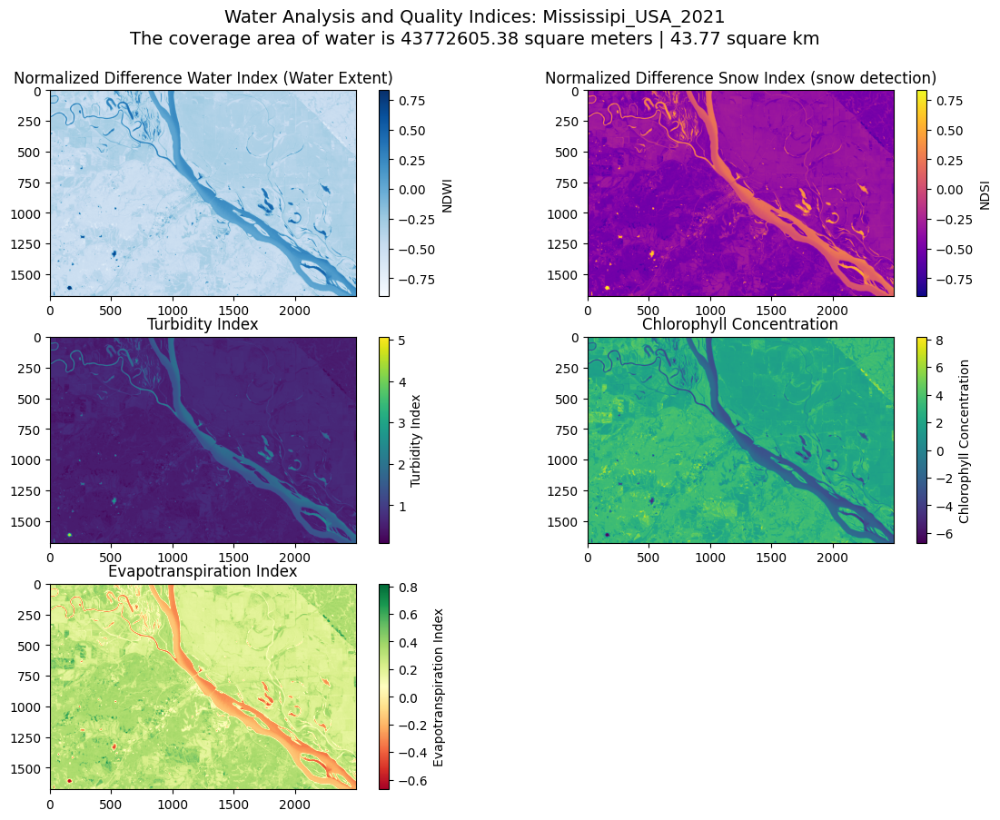

Mississipi_ River Water Quality Analysis May-2022



/tmp/ipykernel_8393/3528730111.py:11: RuntimeWarning: invalid value encountered in divide
  ndwi = (green_data - nir_data) / (green_data + nir_data)


band_descriptions:  (None, None, None)


/tmp/ipykernel_8393/1387134106.py:30: RuntimeWarning: invalid value encountered in divide
  ndwi = (green_data - nir_data) / (green_data + nir_data)
/tmp/ipykernel_8393/1387134106.py:39: RuntimeWarning: invalid value encountered in divide
  ndsi = (green_data - swir_data) / (green_data + swir_data)
/tmp/ipykernel_8393/1387134106.py:48: RuntimeWarning: divide by zero encountered in divide
  turbidity_index = red_data / nir_data  # Placeholder, adjust as needed
/tmp/ipykernel_8393/1387134106.py:48: RuntimeWarning: invalid value encountered in divide
  turbidity_index = red_data / nir_data  # Placeholder, adjust as needed
/tmp/ipykernel_8393/1387134106.py:57: RuntimeWarning: invalid value encountered in divide
  chlorophyll_concentration = 10 * (nir_data - red_data) / (nir_data + red_data)  # Placeholder, adjust as needed
/tmp/ipykernel_8393/1387134106.py:67: RuntimeWarning: invalid value encountered in divide
  evapotranspiration_index = (nir_data - red_data) / (nir_data + red_data)  # P

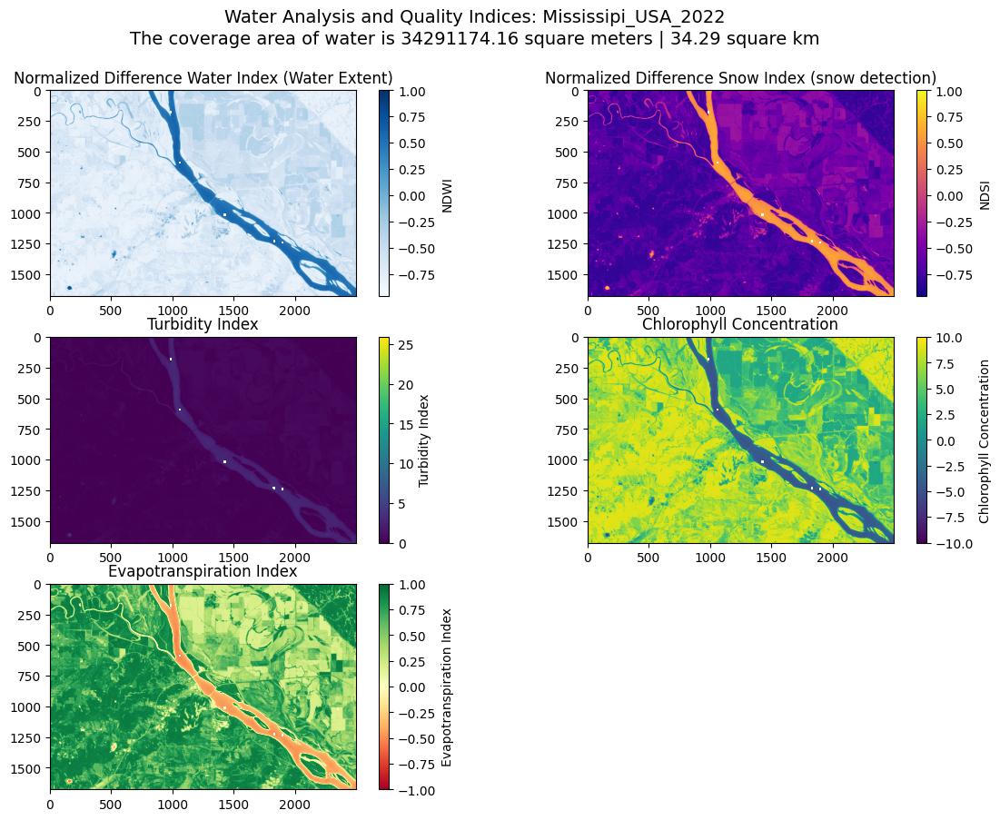

Mississipi_ River Water Quality Analysis May-2023

band_descriptions:  (None, None, None)


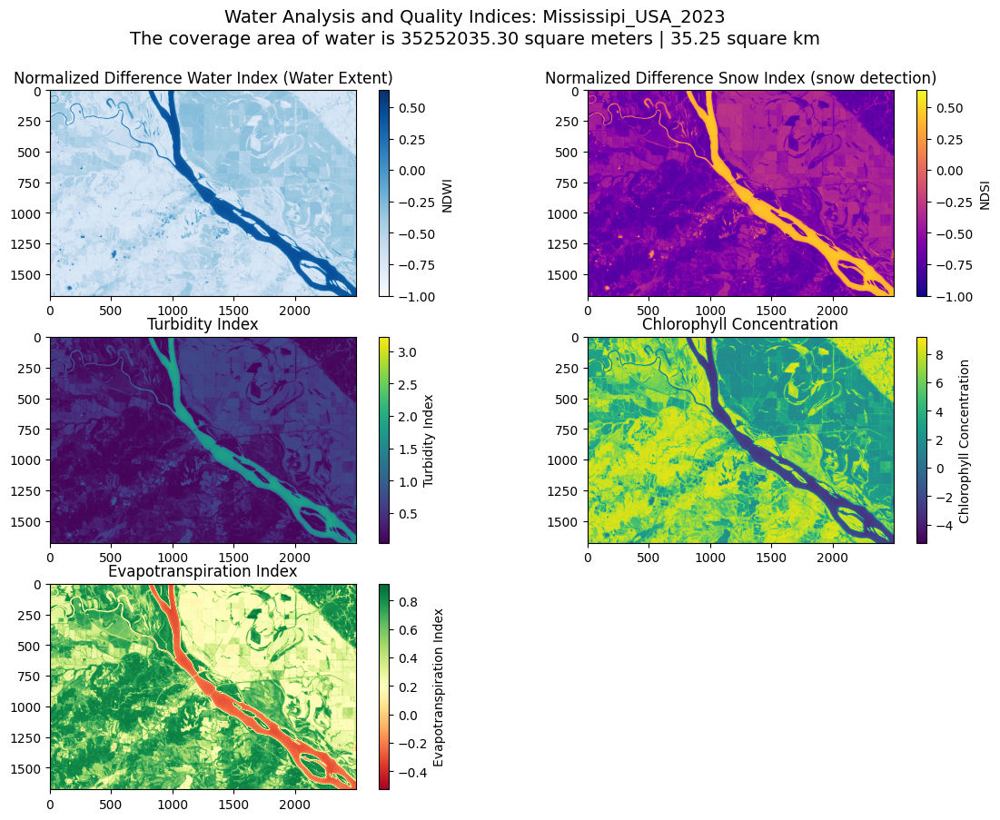

In [35]:
mississipi_river_image_2021 = '../Datasets/Raster/Mississipi_USA//2021-03-04-00:00_2021-03-04-23:59_Sentinel-2_L2A.zip'
mississipi_river_image_2022 = '../Datasets/Raster/Mississipi_USA/2022-09-30-00:00_2022-09-30-23:59_Sentinel-2_L2A.zip'
mississipi_river_image_2023 = '../Datasets/Raster/Mississipi_USA/2023-09-30-00:00_2023-09-30-23:59_Sentinel-2_L2A.zip'

shape_fname = glob.glob('../Datasets/shapefiles/Mississipi_River/mississipi_Poly.shp')
shapes = []
areastyle = []
poly = []

for file in shape_fname:
    shapes.append(gpd.read_file(file))
    areastyle.append({'fillColor': '#0BEE00','color': '#0BEE00'})
    
poly = Polygon(shapes[0].geometry[0])
polycenter = poly.centroid

m = folium.Map([polycenter.y, polycenter.x], zoom_start=10)

for shape in shapes:
    folium.GeoJson(shape, style_function = lambda x: areastyle[0]).add_to(m)

m.fit_bounds(m.get_bounds()) 
display(m)



print('Mississipi_ River Water Quality Analysis May-2021')
water_mask = detect_water(mississipi_river_image_2021)
coverage_area = calculate_water_coverage(mississipi_river_image_2021, water_mask)
water_coverage = f'The coverage area of water is {coverage_area:.2f} square meters | {coverage_area / 1e6:.2f} square km'

ndwi, ndsi, turbidity_index, chlorophyll_concentration, evapotranspiration_index, mississipi_river_2021_median_values_df = calculate_water_indices(mississipi_river_image_2021)
mississipi_river_2021_median_values_df['Year'] = mississipi_river_image_2021.split('/')[-1][:4]
mississipi_river_2021_median_values_df['Water_Coverage-km'] = f"{coverage_area / 1e6:.2f}"
mississipi_river_2021_median_values_df['Location'] = 'Mississipi_River_USA'


plot_title = mississipi_river_image_2021.split('/')[3] + '_' + mississipi_river_image_2021.split('/')[-1][:4]
plot_indices(ndwi, turbidity_index, chlorophyll_concentration, evapotranspiration_index, plot_title + f"\n{water_coverage}", plot_title)


print('Mississipi_ River Water Quality Analysis May-2022')
water_mask = detect_water(mississipi_river_image_2022)
coverage_area = calculate_water_coverage(mississipi_river_image_2022, water_mask)
water_coverage = f'The coverage area of water is {coverage_area:.2f} square meters | {coverage_area / 1e6:.2f} square km'

ndwi, ndsi, turbidity_index, chlorophyll_concentration, evapotranspiration_index, mississipi_river_2022_median_values_df = calculate_water_indices(mississipi_river_image_2022)
mississipi_river_2022_median_values_df['Year'] = mississipi_river_image_2022.split('/')[-1][:4]
mississipi_river_2022_median_values_df['Water_Coverage-km'] = f"{coverage_area / 1e6:.2f}"
mississipi_river_2022_median_values_df['Location'] = 'Mississipi_River_USA'


plot_title = mississipi_river_image_2022.split('/')[3] + '_' + mississipi_river_image_2022.split('/')[-1][:4]
plot_indices(ndwi, turbidity_index, chlorophyll_concentration, evapotranspiration_index, plot_title + f"\n{water_coverage}", plot_title)


print('Mississipi_ River Water Quality Analysis May-2023')
water_mask = detect_water(mississipi_river_image_2023)
coverage_area = calculate_water_coverage(mississipi_river_image_2023, water_mask)
water_coverage = f'The coverage area of water is {coverage_area:.2f} square meters | {coverage_area / 1e6:.2f} square km'

ndwi, ndsi, turbidity_index, chlorophyll_concentration, evapotranspiration_index, mississipi_river_2023_median_values_df = calculate_water_indices(mississipi_river_image_2023)
mississipi_river_2023_median_values_df['Year'] = mississipi_river_image_2023.split('/')[-1][:4]
mississipi_river_2023_median_values_df['Water_Coverage-km'] = f"{coverage_area / 1e6:.2f}"
mississipi_river_2023_median_values_df['Location'] = 'Mississipi_River_USA'


plot_title = mississipi_river_image_2023.split('/')[3] + '_' + mississipi_river_image_2023.split('/')[-1][:4]
plot_indices(ndwi, turbidity_index, chlorophyll_concentration, evapotranspiration_index, plot_title + f"\n{water_coverage}", plot_title)

### Mississipi_River data_frames

In [13]:
# Concatenate the DataFrames
mississipi_river = pd.concat([mississipi_river_2021_median_values_df, mississipi_river_2022_median_values_df, mississipi_river_2023_median_values_df], ignore_index=True)
mississipi_river

,NDWI,NDSI,Turbidity_Index,Chlorophyll_Concentration,Evapotranspiration_Index,Year,Water_Coverage-km,Location
0,-0.384116,-0.536882,0.590849,2.571903,0.257190,2021,43.77,Mississipi_River_USA
1,-0.657895,-0.564667,0.177995,6.978005,0.697801,2022,34.29,Mississipi_River_USA
2,-0.555386,-0.553200,0.283404,5.583556,0.558356,2023,35.25,Mississipi_River_USA


## Qaraoun_lake

Qaraoun_Lake Water Quality Analysis May-2021

band_descriptions:  (None, None, None)


/tmp/ipykernel_8393/1387134106.py:48: RuntimeWarning: divide by zero encountered in divide
  turbidity_index = red_data / nir_data  # Placeholder, adjust as needed
/tmp/ipykernel_8393/1387134106.py:48: RuntimeWarning: invalid value encountered in divide
  turbidity_index = red_data / nir_data  # Placeholder, adjust as needed
/tmp/ipykernel_8393/1387134106.py:57: RuntimeWarning: invalid value encountered in divide
  chlorophyll_concentration = 10 * (nir_data - red_data) / (nir_data + red_data)  # Placeholder, adjust as needed
/tmp/ipykernel_8393/1387134106.py:67: RuntimeWarning: invalid value encountered in divide
  evapotranspiration_index = (nir_data - red_data) / (nir_data + red_data)  # Placeholder, adjust as needed


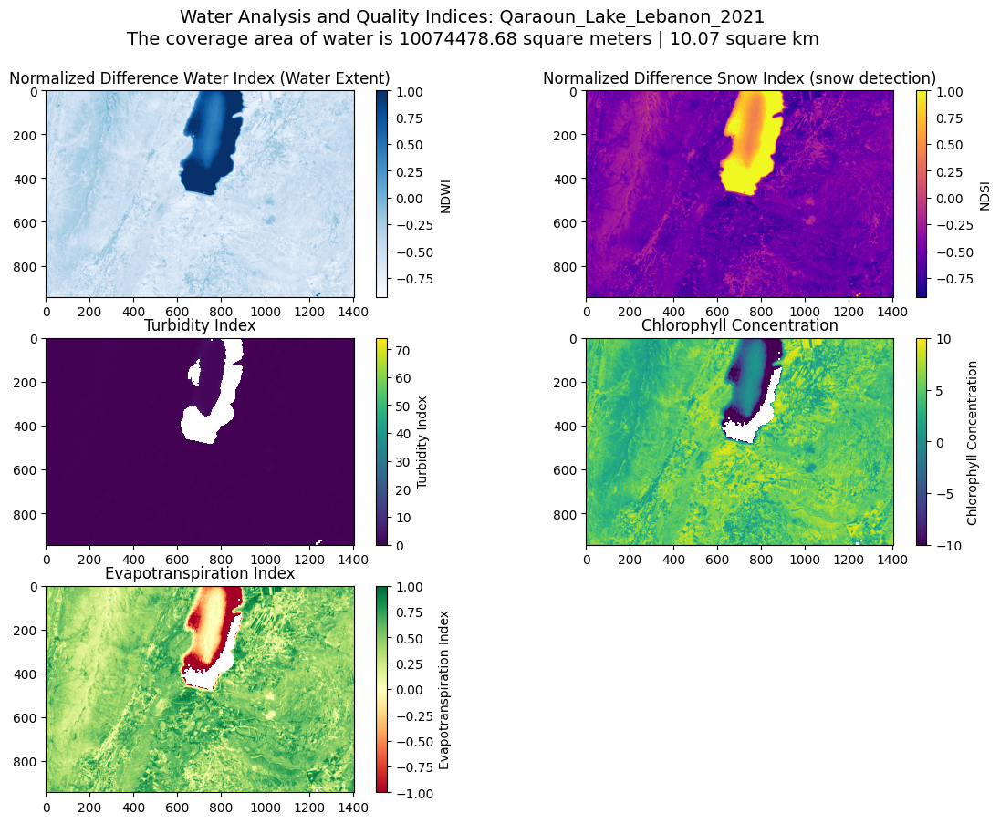

Qaraoun_Lake Water Quality Analysis May-2022

band_descriptions:  (None, None, None)


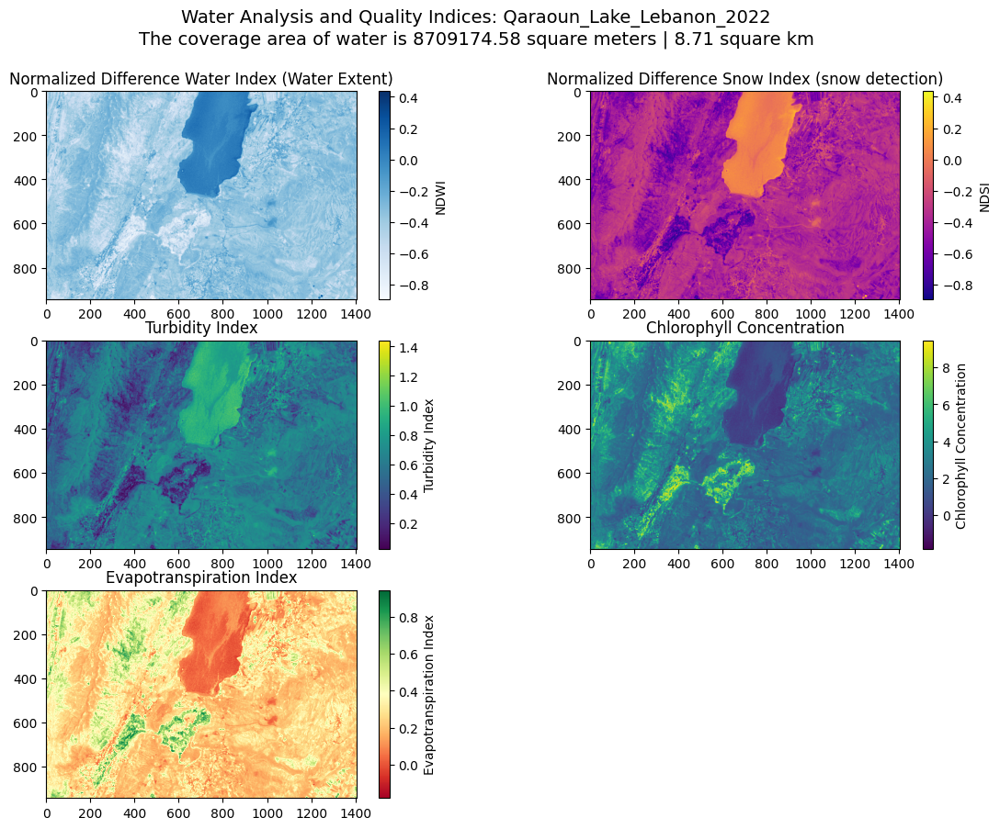

Qaraoun_Lake Water Quality Analysis May-2023

band_descriptions:  (None, None, None)


/tmp/ipykernel_8393/1387134106.py:48: RuntimeWarning: divide by zero encountered in divide
  turbidity_index = red_data / nir_data  # Placeholder, adjust as needed
/tmp/ipykernel_8393/1387134106.py:48: RuntimeWarning: invalid value encountered in divide
  turbidity_index = red_data / nir_data  # Placeholder, adjust as needed
/tmp/ipykernel_8393/1387134106.py:57: RuntimeWarning: invalid value encountered in divide
  chlorophyll_concentration = 10 * (nir_data - red_data) / (nir_data + red_data)  # Placeholder, adjust as needed
/tmp/ipykernel_8393/1387134106.py:67: RuntimeWarning: invalid value encountered in divide
  evapotranspiration_index = (nir_data - red_data) / (nir_data + red_data)  # Placeholder, adjust as needed


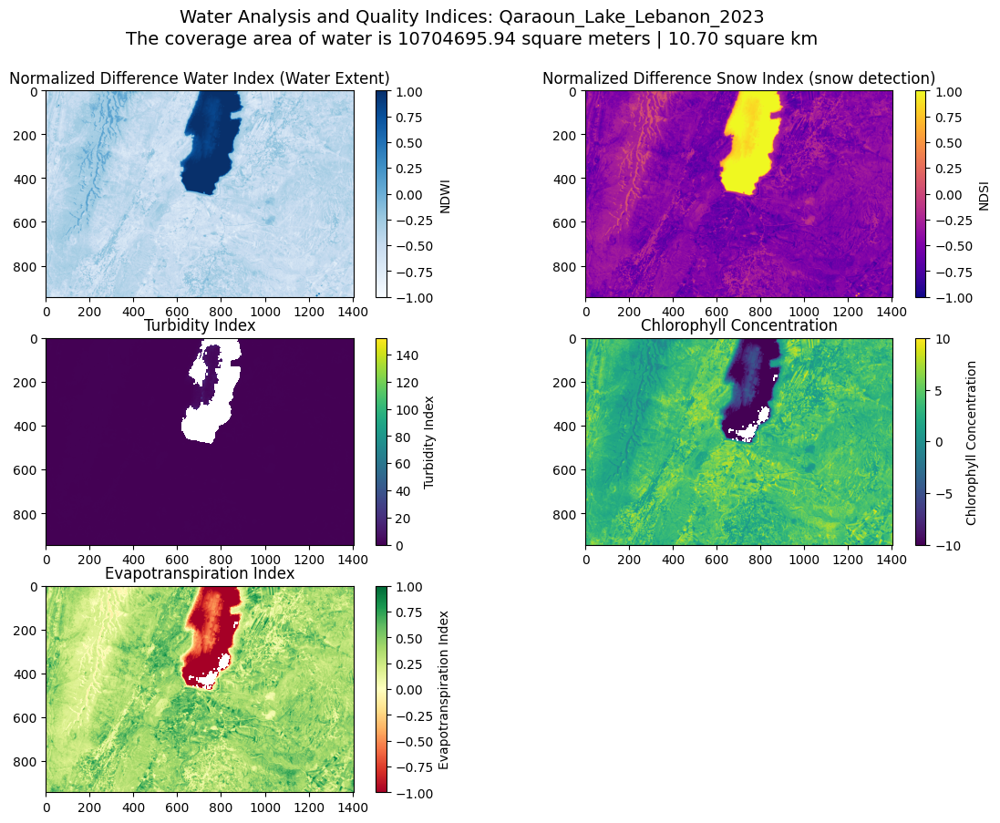

In [36]:
qaraoun_river_image_2021 = '../Datasets/Raster/Qaraoun_Lake_Lebanon//2021-04-15-00:00_2021-04-15-23:59_Sentinel-2_L2A.zip'
qaraoun_river_image_2022 = '../Datasets/Raster/Qaraoun_Lake_Lebanon/2022-05-30-00:00_2022-05-30-23:59_Sentinel-2_L2A.zip'
qaraoun_river_image_2023 = '../Datasets/Raster/Qaraoun_Lake_Lebanon/2023-03-11-00:00_2023-03-11-23:59_Sentinel-2_L2A*.zip'

shape_fname = glob.glob('../Datasets/shapefiles/qaroon_lake/qaraoon_lake_poly.shp')
shapes = []
areastyle = []
poly = []

for file in shape_fname:
    shapes.append(gpd.read_file(file))
    areastyle.append({'fillColor': '#0BEE00','color': '#0BEE00'})
    
poly = Polygon(shapes[0].geometry[0])
polycenter = poly.centroid

m = folium.Map([polycenter.y, polycenter.x], zoom_start=10)

for shape in shapes:
    folium.GeoJson(shape, style_function = lambda x: areastyle[0]).add_to(m)

m.fit_bounds(m.get_bounds()) 
display(m)


print('Qaraoun_Lake Water Quality Analysis May-2021')
water_mask = detect_water(qaraoun_river_image_2021)
coverage_area = calculate_water_coverage(qaraoun_river_image_2021, water_mask)
water_coverage = f'The coverage area of water is {coverage_area:.2f} square meters | {coverage_area / 1e6:.2f} square km'

ndwi, ndsi, turbidity_index, chlorophyll_concentration, evapotranspiration_index, qaraoun_river_2021_median_values_df = calculate_water_indices(qaraoun_river_image_2021)
qaraoun_river_2021_median_values_df['Year'] = qaraoun_river_image_2021.split('/')[-1][:4]
qaraoun_river_2021_median_values_df['Water_Coverage-km'] = f"{coverage_area / 1e6:.2f}"
qaraoun_river_2021_median_values_df['Location'] = 'Qaraoun_Lake_Lebanon'

plot_title = qaraoun_river_image_2021.split('/')[3] + '_' + qaraoun_river_image_2021.split('/')[-1][:4]
plot_indices(ndwi, turbidity_index, chlorophyll_concentration, evapotranspiration_index, plot_title + f"\n{water_coverage}", plot_title)


print('Qaraoun_Lake Water Quality Analysis May-2022')
water_mask = detect_water(qaraoun_river_image_2022)
coverage_area = calculate_water_coverage(qaraoun_river_image_2022, water_mask)
water_coverage = f'The coverage area of water is {coverage_area:.2f} square meters | {coverage_area / 1e6:.2f} square km'

ndwi, ndsi, turbidity_index, chlorophyll_concentration, evapotranspiration_index, qaraoun_river_2022_median_values_df = calculate_water_indices(qaraoun_river_image_2022)
qaraoun_river_2022_median_values_df['Year'] = qaraoun_river_image_2022.split('/')[-1][:4]
qaraoun_river_2022_median_values_df['Water_Coverage-km'] = f"{coverage_area / 1e6:.2f}"
qaraoun_river_2022_median_values_df['Location'] = 'Qaraoun_Lake_Lebanon'


plot_title = qaraoun_river_image_2022.split('/')[3] + '_' + qaraoun_river_image_2022.split('/')[-1][:4]
plot_indices(ndwi, turbidity_index, chlorophyll_concentration, evapotranspiration_index, plot_title + f"\n{water_coverage}", plot_title)


print('Qaraoun_Lake Water Quality Analysis May-2023')
water_mask = detect_water(qaraoun_river_image_2023)
coverage_area = calculate_water_coverage(qaraoun_river_image_2023, water_mask)
water_coverage = f'The coverage area of water is {coverage_area:.2f} square meters | {coverage_area / 1e6:.2f} square km'

ndwi, ndsi, turbidity_index, chlorophyll_concentration, evapotranspiration_index, qaraoun_river_2023_median_values_df = calculate_water_indices(qaraoun_river_image_2023)
qaraoun_river_2023_median_values_df['Year'] = qaraoun_river_image_2023.split('/')[-1][:4]
qaraoun_river_2023_median_values_df['Water_Coverage-km'] = f"{coverage_area / 1e6:.2f}"
qaraoun_river_2023_median_values_df['Location'] = 'Qaraoun_Lake_Lebanon'


plot_title = qaraoun_river_image_2023.split('/')[3] + '_' + qaraoun_river_image_2023.split('/')[-1][:4]
plot_indices(ndwi, turbidity_index, chlorophyll_concentration, evapotranspiration_index, plot_title + f"\n{water_coverage}", plot_title)

### Qaraoun_Lake data_frames

In [15]:
# Concatenate the DataFrames
qaraoun_lake = pd.concat([qaraoun_river_2021_median_values_df, qaraoun_river_2022_median_values_df, qaraoun_river_2023_median_values_df], ignore_index=True)
qaraoun_lake

,NDWI,NDSI,Turbidity_Index,Chlorophyll_Concentration,Evapotranspiration_Index,Year,Water_Coverage-km,Location
0,-0.487896,-0.436821,0.366920,4.631437,0.463144,2021,10.07,Qaraoun_Lake_Lebanon
1,-0.362725,-0.410109,0.610011,2.422275,0.242228,2022,8.71,Qaraoun_Lake_Lebanon
2,-0.437544,-0.435274,0.469203,3.612823,0.361282,2023,10.70,Qaraoun_Lake_Lebanon


## Data Comparaison Plots

In [16]:
# # Generating a profiling report for the Android V1 log dataset
# qaraoun_lake_df_profile_2021 = ProfileReport(qaraoun_river_2021_median_values_df, title='Qaraoun_Lake_2021',
#                                       explorative=True,
#                                       dark_mode=True, infer_dtypes=False,
#                                      )
# # Displaying the profiling report in the notebook
# qaraoun_lake_df_profile_2021.to_notebook_iframe()

# # Generating a profiling report for the Android V1 log dataset
# qaraoun_lake_df_profile_2022 = ProfileReport(qaraoun_river_2022_median_values_df, title='Qaraoun_Lake_2022',
#                                       explorative=True,
#                                       dark_mode=True, infer_dtypes=False,
#                                      )
# # Displaying the profiling report in the notebook
# qaraoun_lake_df_profile_2022.to_notebook_iframe()

# # Generating a profiling report for the Android V1 log dataset
# qaraoun_lake_df_profile_2023 = ProfileReport(qaraoun_river_2023_median_values_df, title='Qaraoun_Lake_2023',
#                                       explorative=True,
#                                       dark_mode=True, infer_dtypes=False,
#                                      )
# # Displaying the profiling report in the notebook
# qaraoun_lake_df_profile_2023.to_notebook_iframe()


# # Comparing data profiles for Android V1, V2, and V3 datasets
# comparison_report_measures = compare([qaraoun_lake_df_profile_2021, qaraoun_lake_df_profile_2022, qaraoun_lake_df_profile_2023])

# # Obtaining merged statistics from the comparison report
# statistics_measures = comparison_report_measures.get_description()

# # Displaying the comparison report in the notebook
# comparison_report_measures.to_notebook_iframe()

# # Saving the comparison report as an HTML file
# comparison_report_measures.to_file('deliverables/Data_Compare_Reports/qaraoun_Data_Statistical-Comparaison.html')

In [19]:
## Premise Child Health COVID-19 Health Services Disruption Survey 2021
org_data= pd.read_csv('../Datasets/Organization Data/IHME_PREM_CH_HEALTH_2021_Y2021M09D14.CSV')
org_data

,country,location_id,observation_id,user_id,submission_time,age,gender,geography,financial_situation,education,...,u2_no_provider_why_3,u2_no_provider_why_4,u2_no_provider_why_5,u2_no_provider_why_6,u2_no_provider_why_7,u2_no_provider_why_8,u2_no_provider_why_99,u2_no_provider_why_88,u2_no_provider_why_2,u2_no_provider_why_1
0,Afghanistan,160,u2_6310674962841600,u2_5864930355183616,2021-05-28 19:47:59.677 UTC,2,1,1,99,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Afghanistan,160,u2_6672867004776448,u2_4712346424705024,2021-05-28 21:16:48.489 UTC,2,1,1,3,8,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Afghanistan,160,u2_5146086896566272,u2_5744563913490432,2021-05-28 21:51:55.506 UTC,2,1,2,5,10,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Afghanistan,160,u2_6670050613526528,u2_4529606817480704,2021-05-28 21:18:13.08 UTC,2,1,2,3,7,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Afghanistan,160,u2_6113826713108480,u2_6260553241853952,2021-05-28 21:06:01.771 UTC,2,1,2,3,10,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7378,Yemen,157,u2_4551536041787392,u2_5938925142278144,2021-06-20 00:03:58.581 UTC,3,99,2,2,8,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7379,Yemen,157,u2_6259964174925824,u2_5749479826522112,2021-06-19 23:30:19.95 UTC,2,1,2,99,10,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7380,Yemen,157,u2_5836943652028416,u2_6070982996656128,2021-06-19 23:47:21.174 UTC,2,2,1,6,8,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7381,Yemen,157,u2_6151060380188672,u2_5421476542152704,2021-06-20 00:24:39.996 UTC,3,99,1,3,10,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [17]:
# Concatenate the DataFrames
df = pd.concat([ganges_river, nile_river, mississipi_river, qaraoun_lake], ignore_index=True)
df

,NDWI,NDSI,Turbidity_Index,Chlorophyll_Concentration,Evapotranspiration_Index,Year,Water_Coverage-km,Location
0,-0.512443,-0.476347,0.373053,4.566077,0.456608,2021,7.14,Ganges_River_India
1,-0.493480,-0.445479,0.364694,4.655296,0.465530,2022,9.22,Ganges_River_India
2,-0.467890,-0.444888,0.403260,4.252522,0.425252,2023,8.23,Ganges_River_India
3,-0.470228,-0.333029,0.390582,4.382463,0.438246,2021,4.99,Nile_River_Egypt
4,-0.460500,-0.331184,0.415229,4.131987,0.413199,2022,2.93,Nile_River_Egypt
5,-0.484156,-0.341956,0.373579,4.560500,0.456050,2023,5.47,Nile_River_Egypt
6,-0.384116,-0.536882,0.590849,2.571903,0.257190,2021,43.77,Mississipi_River_USA
7,-0.657895,-0.564667,0.177995,6.978005,0.697801,2022,34.29,Mississipi_River_USA
8,-0.555386,-0.553200,0.283404,5.583556,0.558356,2023,35.25,Mississipi_River_USA
9,-0.487896,-0.436821,0.366920,4.631437,0.463144,2021,10.07,Qaraoun_Lake_Lebanon


In [37]:
# Color schemes for each location
color_schemes = {
    'Ganges_River_India': 'blue',
    'Nile_River_Egypt': 'orange',
    'Mississipi_River_USA': 'green',
    'Qaraoun_Lake_Lebanon': 'red',
}

# Initialize the Dash app
app = dash.Dash(__name__)

# App layout
app.layout = html.Div([
    html.H1("AQUA Dashboard", style={'color': 'cyan'}),
    
    # Bar plots
    dcc.Graph(
        id='water-coverage-bar-plot',
        figure=px.bar(df, x='Year', y='Water_Coverage-km', color='Location', color_discrete_map=color_schemes,
                      labels={'Water_Coverage-km': 'Water Coverage (km)'}).update_layout(title='Water Coverage vs Year')
    ),

    dcc.Graph(
        id='chlorophyll-bar-plot',
        figure=px.bar(df, x='Year', y='Chlorophyll_Concentration', color='Location', color_discrete_map=color_schemes,
                      labels={'Chlorophyll_Concentration': 'Chlorophyll Concentration'}).update_layout(title='Chlorophyll Concentration vs Year')
    ),

    dcc.Graph(
        id='evapotranspiration-bar-plot',
        figure=px.bar(df, x='Year', y='Evapotranspiration_Index', color='Location', color_discrete_map=color_schemes,
                      labels={'Evapotranspiration_Index': 'Evapotranspiration Index'}).update_layout(title='Evapotranspiration Index vs Year')
    ),

    dcc.Graph(
        id='turbidity-bar-plot',
        figure=px.bar(df, x='Year', y='Turbidity_Index', color='Location', color_discrete_map=color_schemes,
                      labels={'Turbidity_Index': 'Turbidity Index'}).update_layout(title='Turbidity Index vs Year')
    ),

    dcc.Graph(
        id='ndwi-bar-plot',
        figure=px.bar(df, x='Year', y='NDWI', color='Location', color_discrete_map=color_schemes,
                      labels={'NDWI': 'NDWI'}).update_layout(title='NDWI vs Year')
    ),

    dcc.Graph(
        id='ndsi-bar-plot',
        figure=px.bar(df, x='Year', y='NDSI', color='Location', color_discrete_map=color_schemes,
                      labels={'NDSI': 'NDSI'}).update_layout(title='NDSI vs Year')
    ),

    # Distributions
    dcc.Graph(
        id='ndwi-distribution-plot',
        figure=px.histogram(df, x='NDWI', color='Location', marginal='box', color_discrete_map=color_schemes,
                             labels={'NDWI': 'NDWI'}).update_layout(title='NDWI Distribution')
    ),

    dcc.Graph(
        id='ndsi-distribution-plot',
        figure=px.histogram(df, x='NDSI', color='Location', marginal='box', color_discrete_map=color_schemes,
                             labels={'NDSI': 'NDSI'}).update_layout(title='NDSI Distribution')
    ),
])

# Run the app
if __name__ == '__main__':
    app.run_server(debug=True)

## FrameWork Diagram

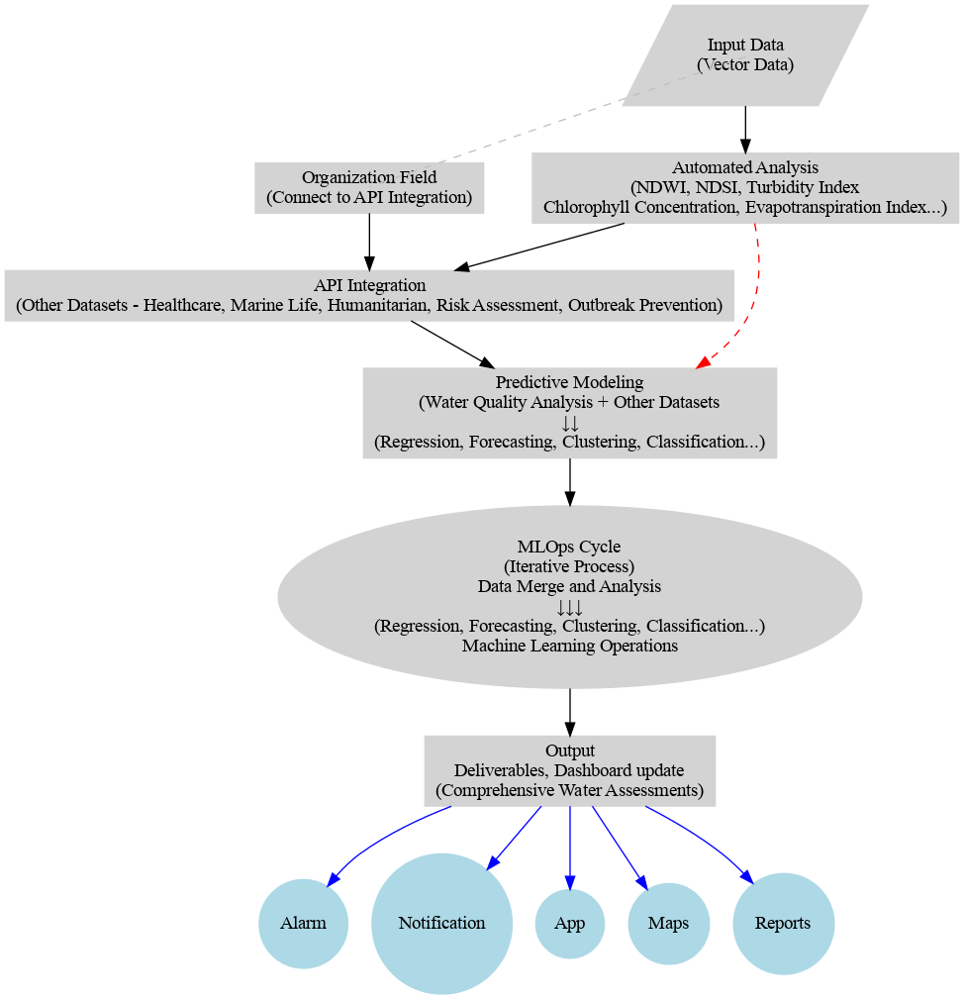

In [181]:
# Import necessary libraries
import pygraphviz as pgv
from IPython.display import Image

# Create a new directed graph with specified width and height
graph = pgv.AGraph(directed=True, rankdir='TB', bgcolor='white', fontcolor='black', fontsize=13, width=12, height=10)

# Define nodes with academic styling
graph.add_node('InputData', shape='parallelogram', color='lightgray', style='filled', label='Input Data\n(Vector Data)')
graph.add_node('AutomatedAnalysis', shape='box', color='lightgray', style='filled', label='Automated Analysis\n(NDWI, NDSI, Turbidity Index\nChlorophyll Concentration, Evapotranspiration Index...)')
graph.add_node('APIIntegration', shape='box', color='lightgray', style='filled', label='API Integration\n(Other Datasets - Healthcare, Marine Life, Humanitarian, Risk Assessment, Outbreak Prevention)')
graph.add_node('PredictiveModeling', shape='box', color='lightgray', style='filled', label='Predictive Modeling\n(Water Quality Analysis + Other Datasets\n↓↓\n(Regression, Forecasting, Clustering, Classification...)')
graph.add_node('MLOPS', shape='ellipse', color='lightgray', style='filled', label='MLOps Cycle\n(Iterative Process)\nData Merge and Analysis\n↓↓↓\n(Regression, Forecasting, Clustering, Classification...)\nMachine Learning Operations')
graph.add_node('Output', shape='box', color='lightgray', style='filled', label='Output\nDeliverables, Dashboard update\n(Comprehensive Water Assessments)')
graph.add_node('OrganizationField', shape='box', color='lightgray', style='filled', label='Organization Field\n(Connect to API Integration)')

# Circular boxes for Alarm, Notification, App, Maps, and Reports
graph.add_node('Alarm', shape='circle', color='lightblue', style='filled', label='Alarm')
graph.add_node('Notification', shape='circle', color='lightblue', style='filled', label='Notification')
graph.add_node('App', shape='circle', color='lightblue', style='filled', label='App')
graph.add_node('Maps', shape='circle', color='lightblue', style='filled', label='Maps')
graph.add_node('Reports', shape='circle', color='lightblue', style='filled', label='Reports')

# Connect nodes
graph.add_edge('InputData', 'AutomatedAnalysis', color='black')
graph.add_edge('AutomatedAnalysis', 'APIIntegration', color='black')
graph.add_edge('APIIntegration', 'PredictiveModeling', color='black')
graph.add_edge('PredictiveModeling', 'MLOPS', color='black')
graph.add_edge('MLOPS', 'Output', color='black')

# Add another parallel bypass arrow from AutomatedAnalysis to PredictiveModeling with a different color
graph.add_edge('AutomatedAnalysis', 'PredictiveModeling', color='red', style='dashed')

# Connect organization field to API Integration
graph.add_edge('OrganizationField', 'APIIntegration', color='black')

# Add external connection from Output to 'Alarm', 'Notification', 'App', 'Maps', and 'Reports'
graph.add_edge('Output', 'Alarm', color='blue', style='solid')
graph.add_edge('Output', 'Notification', color='blue', style='solid')
graph.add_edge('Output', 'App', color='blue', style='solid')
graph.add_edge('Output', 'Maps', color='blue', style='solid')
graph.add_edge('Output', 'Reports', color='blue', style='solid')

# Specify the rank for InputData and OrganizationField to be the same
graph.add_edge('InputData', 'OrganizationField', style='invis')

# Curved line without arrow connecting InputData and OrganizationField
graph.add_edge('InputData', 'OrganizationField', style='dashed', color='gray', constraint='false', dir='none', tailclip='false', headclip='false', decorate='true', labeldistance='2', labelangle='30', fontsize='10', curved='0.3')

# Save and render the graph as an image
graph.draw('deliverables/Diagram/WaterQualityFramework_EcoEquity.png', format='png', prog='dot')

# Display the graph
Image(filename='deliverables/Diagram/WaterQualityFramework_EcoEquity.png')
